**Task 1** **Level 2**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [3]:
df= pd.read_csv("/content/Dataset .csv")
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [4]:
aggregate_ratings = df["Aggregate rating"]
rating_count = aggregate_ratings.value_counts().sort_index()


In [5]:
most_common_rating_range = rating_count.idxmax()
print("most common rating range :", most_common_rating_range)

most common rating range : 0.0


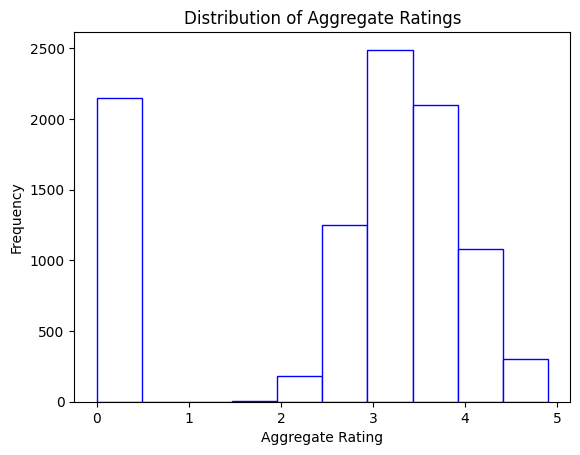

In [6]:
plt.hist(aggregate_ratings,color= "white", edgecolor = "blue")
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Aggregate Ratings')
plt.show()

In [7]:
average_vote = df['Votes'].mean()
print("The Average number of votes received by restaurants",average_vote)

The Average number of votes received by restaurants 156.909747670401


**Task 2_Level 2**


In [8]:
cuisines= df["Cuisines"]
aggregate = df["Aggregate rating"]
cuisines_counts = cuisines.value_counts()

In [9]:
most_common_cuisines = cuisines_counts.head(10)
print("Most Common Combination of Cuisine")
print(most_common_cuisines)

Most Common Combination of Cuisine
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


In [10]:
cuisine_combination_avg_rating = df.groupby("Cuisines")["Aggregate rating"].mean()

In [11]:
Top_10_avg_rating = cuisine_combination_avg_rating.nlargest(10)
print("Average Rating for Top 10 Cuisine Combination:")
print(Top_10_avg_rating)

Average Rating for Top 10 Cuisine Combination:
Cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
BBQ, Breakfast, Southern        4.9
Burger, Bar Food, Steak         4.9
Continental, Indian             4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
Name: Aggregate rating, dtype: float64


**Task_3_Level_2**

In [12]:
pip install folium

In [13]:
import folium
from IPython.display import display
from sklearn.cluster import KMeans

In [14]:
restaurant_name = df["Restaurant Name"]
latitude = df["Latitude"]
longitude = df["Longitude"]

In [15]:
a = df[["Latitude","Longitude"]]
num_clusters= 5

In [16]:
Kmeans = KMeans(n_clusters= num_clusters,n_init='auto',random_state=42)
df["cluster"]= Kmeans.fit_predict(a)

In [17]:
map_center =[latitude.mean(), longitude.mean()]
restaurant_map = folium.Map(location= map_center,zoom_start=12)
cluster_colors = ['red', 'green', 'purpel', 'red','blue']

In [18]:
for index, row in df.iterrows():
  resyaurant_name =row["Restaurant Name"]
  latitude =row["Latitude"]
  longitude =row["Longitude"]
  cuisines = row["Cuisines"]
  rating =row["Aggregate rating"]
  cluster =row["cluster"]
  popup_text = "Restaurant:{retaurant_name}\nCuisines:{cuisines}\nRating:{rating}"
  marker = folium.Marker([latitude,longitude],popup=popup_text)
  marker.add_to(restaurant_map)

In [19]:
display(restaurant_map)

**Task_4_Level_4**

In [20]:
restaurant_chains = df.groupby("Restaurant Name").size().reset_index(name="Chain Count")
restaurant_chains = restaurant_chains[restaurant_chains["Chain Count"]>1]
restaurant_chains = restaurant_chains.sort_values(by="Chain Count", ascending=False)

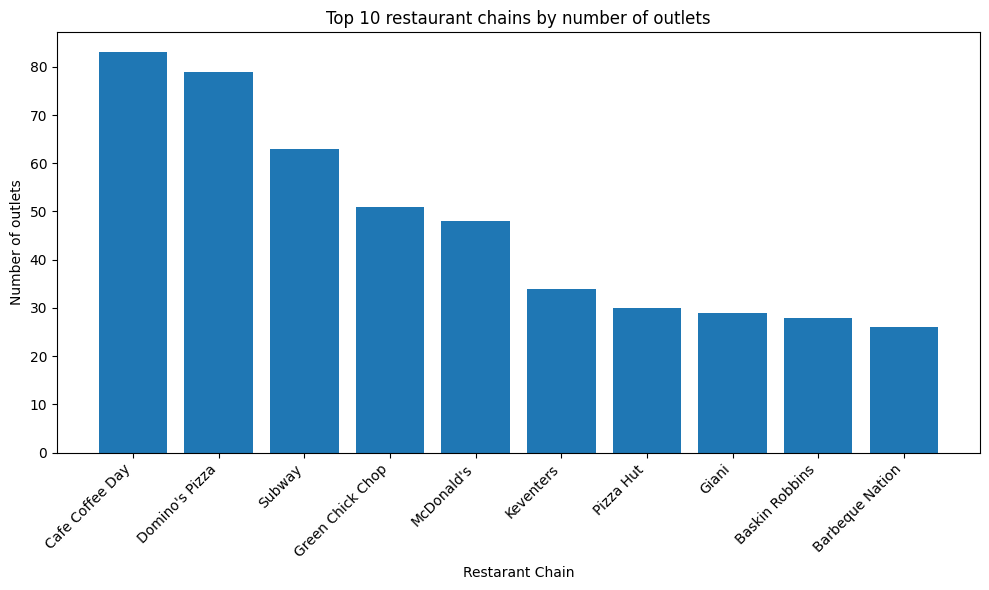

In [21]:
plt.figure(figsize=(10,6))
plt.bar(restaurant_chains["Restaurant Name"][:10],restaurant_chains["Chain Count"][:10])
plt.xticks(rotation=45, ha='right')
plt.xlabel("Restarant Chain")
plt.ylabel("Number of outlets")
plt.title("Top 10 restaurant chains by number of outlets")
plt.tight_layout()
plt.show()

In [26]:
chain_ratings = df.groupby("Restaurant Name")["Aggregate rating"].mean().reset_index(name="Average Rating")
chain_votes = df.groupby("Restaurant Name")["Votes"].sum().reset_index(name="Total Votes")
chain_analysis=pd.merge(chain_ratings, chain_votes,on="Restaurant Name")
chain_analysis = chain_analysis.sort_values(by="Average Rating",ascending=False)

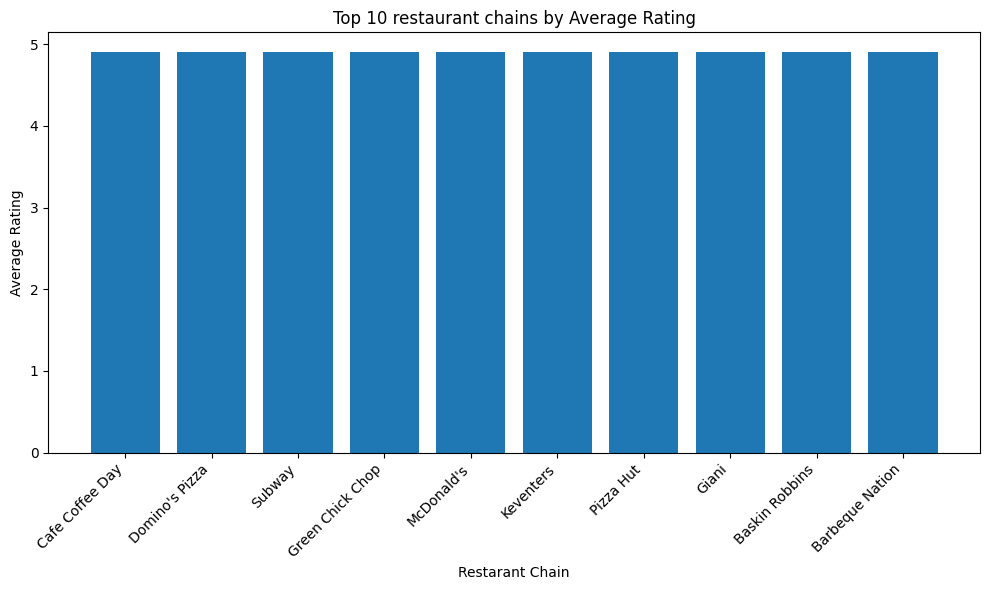

In [29]:
plt.figure(figsize=(10,6))
plt.bar(restaurant_chains["Restaurant Name"][:10],chain_analysis["Average Rating"][:10])
plt.xticks(rotation=45, ha='right')
plt.xlabel("Restarant Chain")
plt.ylabel("Average Rating")
plt.title("Top 10 restaurant chains by Average Rating")
plt.tight_layout()
plt.show()